### Phân tích và dự đoán về chất lượng không khí sử dụng chỉ số AQI
- AQI (Air Quality Index – chỉ số chất lượng không khí) là chỉ số báo cáo chất lượng không khí hàng ngày, sử dụng tương tự như thước đo để đánh giá không khí xung quanh chúng ta sạch sẽ hay ô nhiễm, nếu ô nhiễm thì mức độ cao hay thấp.
- Theo như tính toán từ các chuyên gia thuốc EPA – Cơ quan bảo vệ môi trường Hoa Kỳ cho biết, chỉ số AQI có những thông số ô nhiễm môi trường phổ biến bao gồm:

– Ozone mặt đất: Những chất ô nhiễm xuất phát từ nhà máy, xí nghiệp, xe cộ,… rồi phản ứng hóa học với ánh sáng của mặt trời.

– Ô nhiễm phân tử: Đánh giá qua chỉ số PM 2.5, PM 10. Hạt bụi này sẽ đi vào trong đường hô hấp của con người thông qua hít thở. Chúng được hình thành từ những chất như nitơ, sunphua, cacbon cũng những hợp chất khác. Ngoài ra loại hạt PM 2.5 còn được sinh ra từ việc đốt rác thải, nhiên liệu hóa thạch, bụi công trình, nhiên liệu xe cộ, hút thuốc, phá rừng.

– Chỉ số sulfur dioxide, carbon monoxide, nitrogen dioxide

– Mỗi một chất là tác nhân gây ra ô nhiễm thì EPA đã thiết lập nhưng tiêu chuẩn chỉ số chất lượng không khí quốc gia nhằm bảo vệ sức khỏe con người. Vậy chỉ số AQI là bao nhiêu sẽ nguy hiểm đến sức khỏe:

+ Từ 0 – 50: Mức tốt

+ Từ 51 – 100: Chất lượng không khí trung bình có thể chấp nhận được

+ Từ 101 – 150: Mức độ kém gây ảnh hưởng đến sức khỏe

+ Từ 151 – 200: Mức xấu, cần hạn chế ra ngoài đường khi không cần thiết

+ Từ 201 – 300: Mức rất xấu, cảnh báo gây nguy hiểm đến sức khỏe

+ Từ 301 – 500: Mức báo động, ảnh hưởng nghiêm trọng đến sức khỏe

Đây là tập dữ liệu về chất lượng không khí của thành phố Hà Nội, được lấy thông qua API ở website: https://openweathermap.org/api/air-pollution. Tập dữ liệu gốc bao gồm:
- datetime: Thời gian thực hiện đo đạc
- aqi: Chỉ số AQI trong không khí, được tính theo thang đo của Anh 
- co: Nồng độ chất Carbon monoxide
- no: Nồng độ chất Nitrogen monoxide
- no2: Nồng độ chất Nitrogen dioxide
- o3: Nồng độ chất Ozone
- so2: Nồng độ chất Sulphur dioxide
- pm2_5: Nồng độ bụi mịn PM2.5
- pm10: Nồng độ bụi PM10
- nh3: Nồng độ chất Ammonia
Nồng độ của các chất trên có đơn vị là: μg/m3monia), μg/m3

Vì thang đo aqi trong tập dữ liệu gốc là của Anh Quốc, nên tôi đã tính toán lại chỉ số AQI theo thang đo của Việt Nam, công thức được lấy từ nguồn sau: https://cem.gov.vn/storage/news_file_attach/QD%201459%20TCMT%20ngay%2012.11.2019%20AQI.pdf

In [1]:
import sklearn
print(sklearn.__version__)

1.5.2


### Import module

In [2]:
import pandas as pd
import numpy as np
import seaborn as sns
import plotly.express as px
import matplotlib
import matplotlib.pyplot as plt
import scipy.stats as stats
%matplotlib inline

pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', 150)
sns.set_style('darkgrid')
matplotlib.rcParams['font.size'] = 14
matplotlib.rcParams['figure.figsize'] = (10, 6)
matplotlib.rcParams['figure.facecolor'] = '#00000000'

#### Đọc dữ liệu

In [3]:
raw_df = pd.read_csv('air_quality_data.csv')

In [4]:
raw_df

,datetime,aqi,co,no,no2,o3,so2,pm2_5,pm10,nh3,nowcast_pm2.5,nowcast_pm10,aqi_pm2.5,aqi_pm10,aqi_co,aqi_so2,aqi_no2,aqi_o3,AQI per hour
0,1/1/2022 0:00,5,3177.64,50.51,57.58,0.00,30.52,230.46,270.10,20.27,NaN,NaN,NaN,NaN,15.88820,12.208,28.790,0.000000,28.790000
1,1/1/2022 1:00,5,2750.40,45.15,52.78,0.16,38.15,191.57,223.31,21.03,NaN,NaN,NaN,NaN,13.75200,15.260,26.390,0.050000,26.390000
2,1/1/2022 2:00,5,2349.85,39.79,49.35,0.77,42.92,163.54,188.55,20.52,NaN,NaN,NaN,NaN,11.74925,17.168,24.675,0.240625,24.675000
3,1/1/2022 3:00,5,1949.31,32.63,46.61,3.35,46.73,152.20,174.45,20.52,NaN,NaN,NaN,NaN,9.74655,18.692,23.305,1.046875,23.305000
4,1/1/2022 4:00,5,1268.39,11.73,43.53,20.03,41.48,135.03,151.48,11.65,NaN,NaN,NaN,NaN,6.34195,16.592,21.765,6.259375,21.765000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23304,17/9/2024 0:00,3,881.20,0.33,17.14,21.99,6.74,31.12,40.31,6.59,38.565186,48.752356,77.130371,48.752356,4.40600,2.696,8.570,6.871875,77.130371
23305,17/9/2024 1:00,2,774.38,0.95,14.91,45.06,7.33,22.86,31.36,5.00,30.703704,40.042173,61.407407,40.042173,3.87190,2.932,7.455,14.081250,61.407407
23306,17/9/2024 2:00,2,741.01,1.30,12.34,64.37,7.09,18.98,26.90,4.75,24.831304,33.454229,49.662607,33.454229,3.70505,2.836,6.170,20.115625,49.662607
23307,17/9/2024 3:00,2,694.28,1.08,8.91,84.40,6.62,18.30,25.46,4.50,21.553979,29.438167,43.107959,29.438167,3.47140,2.648,4.455,26.375000,43.107959


In [5]:
raw_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23309 entries, 0 to 23308
Data columns (total 19 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   datetime       23309 non-null  object 
 1   aqi            23309 non-null  int64  
 2   co             23309 non-null  float64
 3   no             23309 non-null  float64
 4   no2            23309 non-null  float64
 5   o3             23309 non-null  float64
 6   so2            23309 non-null  float64
 7   pm2_5          23309 non-null  float64
 8   pm10           23309 non-null  float64
 9   nh3            23309 non-null  float64
 10  nowcast_pm2.5  23298 non-null  float64
 11  nowcast_pm10   23298 non-null  float64
 12  aqi_pm2.5      23128 non-null  float64
 13  aqi_pm10       23175 non-null  float64
 14  aqi_co         23309 non-null  float64
 15  aqi_so2        23309 non-null  float64
 16  aqi_no2        23307 non-null  float64
 17  aqi_o3         23308 non-null  float64
 18  AQI pe

In [6]:
raw_df.describe()

,aqi,co,no,no2,o3,so2,pm2_5,pm10,nh3,nowcast_pm2.5,nowcast_pm10,aqi_pm2.5,aqi_pm10,aqi_co,aqi_so2,aqi_no2,aqi_o3,AQI per hour
count,23309.000000,23309.000000,23309.000000,23309.000000,23309.000000,23309.000000,23309.000000,23309.000000,23309.000000,23298.000000,23298.000000,23128.000000,23175.000000,23309.000000,23309.000000,23307.000000,23308.000000,23309.000000
mean,4.287486,1859.887091,21.602511,48.500450,33.079517,40.764798,111.704274,127.986748,16.222332,110.301961,126.302493,156.076170,88.595744,9.281959,16.261539,24.663290,11.837061,156.275712
std,0.967566,1639.412475,36.940144,96.525131,86.610214,22.026968,100.487196,130.281119,17.728798,96.066683,113.936033,90.324270,64.182767,8.094133,8.545183,12.663554,24.060844,91.450733
min,1.000000,333.790000,0.000000,-9999.000000,-9999.000000,2.410000,2.790000,-9999.000000,0.000000,3.128872,-4985.702549,6.257744,3.595713,1.668950,0.964000,1.435000,0.000000,6.706250
25%,4.000000,894.550000,0.800000,32.900000,0.100000,26.230000,43.790000,53.880000,8.230000,44.207204,54.318682,87.980179,52.089655,4.472750,10.492000,16.450000,0.031250,87.479824
50%,5.000000,1281.740000,5.640000,44.550000,7.780000,34.810000,78.680000,91.430000,11.150000,79.920917,92.903360,148.563481,71.247307,6.408700,13.924000,22.275000,2.431250,148.098169
75%,5.000000,2109.530000,25.930000,59.630000,43.990000,49.110000,143.970000,163.030000,16.970000,144.666367,163.292301,194.711706,105.991937,10.547650,19.644000,29.987500,13.746875,194.747040
max,5.000000,14099.120000,332.590000,260.470000,583.650000,267.030000,821.580000,926.830000,263.450000,751.308284,852.279832,499.710225,499.209385,60.247800,81.562222,106.047000,245.912500,499.710225


Chỉ giữ lại những cột phù hợp cho việc phân tích và dự đoán sau này

In [7]:
aqi_df = raw_df.drop(['aqi', 'co', 'no', 'no2', 'o3', 'so2', 'pm2_5', 'pm10', 'nh3', 'nowcast_pm2.5', 'nowcast_pm10'], axis=1)

In [8]:
aqi_df

,datetime,aqi_pm2.5,aqi_pm10,aqi_co,aqi_so2,aqi_no2,aqi_o3,AQI per hour
0,1/1/2022 0:00,NaN,NaN,15.88820,12.208,28.790,0.000000,28.790000
1,1/1/2022 1:00,NaN,NaN,13.75200,15.260,26.390,0.050000,26.390000
2,1/1/2022 2:00,NaN,NaN,11.74925,17.168,24.675,0.240625,24.675000
3,1/1/2022 3:00,NaN,NaN,9.74655,18.692,23.305,1.046875,23.305000
4,1/1/2022 4:00,NaN,NaN,6.34195,16.592,21.765,6.259375,21.765000
...,...,...,...,...,...,...,...,...
23304,17/9/2024 0:00,77.130371,48.752356,4.40600,2.696,8.570,6.871875,77.130371
23305,17/9/2024 1:00,61.407407,40.042173,3.87190,2.932,7.455,14.081250,61.407407
23306,17/9/2024 2:00,49.662607,33.454229,3.70505,2.836,6.170,20.115625,49.662607
23307,17/9/2024 3:00,43.107959,29.438167,3.47140,2.648,4.455,26.375000,43.107959


Thêm cột thang đo chỉ số AQI vào dataset

In [9]:
def AQI_Range(x):
    if x<=50:
        return "Good"
    elif x>50 and x<=100:
        return "Moderate"
    elif x>100 and x<=200:
        return "Poor"
    elif x>200 and x<=300:
        return "Unhealthy"
    elif x>300 and x<=400:
        return "Very unhealthy"
    elif x>400:
        return "Hazardous"

aqi_df['AQI_Range'] = aqi_df['AQI per hour'] .apply(AQI_Range)
aqi_df.head()

,datetime,aqi_pm2.5,aqi_pm10,aqi_co,aqi_so2,aqi_no2,aqi_o3,AQI per hour,AQI_Range
0,1/1/2022 0:00,NaN,NaN,15.88820,12.208,28.790,0.000000,28.790,Good
1,1/1/2022 1:00,NaN,NaN,13.75200,15.260,26.390,0.050000,26.390,Good
2,1/1/2022 2:00,NaN,NaN,11.74925,17.168,24.675,0.240625,24.675,Good
3,1/1/2022 3:00,NaN,NaN,9.74655,18.692,23.305,1.046875,23.305,Good
4,1/1/2022 4:00,NaN,NaN,6.34195,16.592,21.765,6.259375,21.765,Good


In [10]:
aqi_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23309 entries, 0 to 23308
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   datetime      23309 non-null  object 
 1   aqi_pm2.5     23128 non-null  float64
 2   aqi_pm10      23175 non-null  float64
 3   aqi_co        23309 non-null  float64
 4   aqi_so2       23309 non-null  float64
 5   aqi_no2       23307 non-null  float64
 6   aqi_o3        23308 non-null  float64
 7   AQI per hour  23309 non-null  float64
 8   AQI_Range     23309 non-null  object 
dtypes: float64(7), object(2)
memory usage: 1.6+ MB


In [11]:
aqi_df.describe()

,aqi_pm2.5,aqi_pm10,aqi_co,aqi_so2,aqi_no2,aqi_o3,AQI per hour
count,23128.000000,23175.000000,23309.000000,23309.000000,23307.000000,23308.000000,23309.000000
mean,156.076170,88.595744,9.281959,16.261539,24.663290,11.837061,156.275712
std,90.324270,64.182767,8.094133,8.545183,12.663554,24.060844,91.450733
min,6.257744,3.595713,1.668950,0.964000,1.435000,0.000000,6.706250
25%,87.980179,52.089655,4.472750,10.492000,16.450000,0.031250,87.479824
50%,148.563481,71.247307,6.408700,13.924000,22.275000,2.431250,148.098169
75%,194.711706,105.991937,10.547650,19.644000,29.987500,13.746875,194.747040
max,499.710225,499.209385,60.247800,81.562222,106.047000,245.912500,499.710225


In [12]:
aqi_df.nunique()

datetime        23309
aqi_pm2.5       23127
aqi_pm10        23174
aqi_co            389
aqi_so2           386
aqi_no2           387
aqi_o3            695
AQI per hour    23247
AQI_Range           6
dtype: int64

In [13]:
aqi_df.isnull().sum()

datetime          0
aqi_pm2.5       181
aqi_pm10        134
aqi_co            0
aqi_so2           0
aqi_no2           2
aqi_o3            1
AQI per hour      0
AQI_Range         0
dtype: int64

In [14]:
aqi_df.fillna(0, inplace=True)

In [15]:
aqi_df.isnull().sum()

datetime        0
aqi_pm2.5       0
aqi_pm10        0
aqi_co          0
aqi_so2         0
aqi_no2         0
aqi_o3          0
AQI per hour    0
AQI_Range       0
dtype: int64

In [16]:
aqi_df

,datetime,aqi_pm2.5,aqi_pm10,aqi_co,aqi_so2,aqi_no2,aqi_o3,AQI per hour,AQI_Range
0,1/1/2022 0:00,0.000000,0.000000,15.88820,12.208,28.790,0.000000,28.790000,Good
1,1/1/2022 1:00,0.000000,0.000000,13.75200,15.260,26.390,0.050000,26.390000,Good
2,1/1/2022 2:00,0.000000,0.000000,11.74925,17.168,24.675,0.240625,24.675000,Good
3,1/1/2022 3:00,0.000000,0.000000,9.74655,18.692,23.305,1.046875,23.305000,Good
4,1/1/2022 4:00,0.000000,0.000000,6.34195,16.592,21.765,6.259375,21.765000,Good
...,...,...,...,...,...,...,...,...,...
23304,17/9/2024 0:00,77.130371,48.752356,4.40600,2.696,8.570,6.871875,77.130371,Moderate
23305,17/9/2024 1:00,61.407407,40.042173,3.87190,2.932,7.455,14.081250,61.407407,Moderate
23306,17/9/2024 2:00,49.662607,33.454229,3.70505,2.836,6.170,20.115625,49.662607,Good
23307,17/9/2024 3:00,43.107959,29.438167,3.47140,2.648,4.455,26.375000,43.107959,Good


In [17]:
aqi_df['AQI_Range'].value_counts()

AQI_Range
Poor              10789
Moderate           5404
Unhealthy          3517
Good               1740
Very unhealthy     1210
Hazardous           649
Name: count, dtype: int64

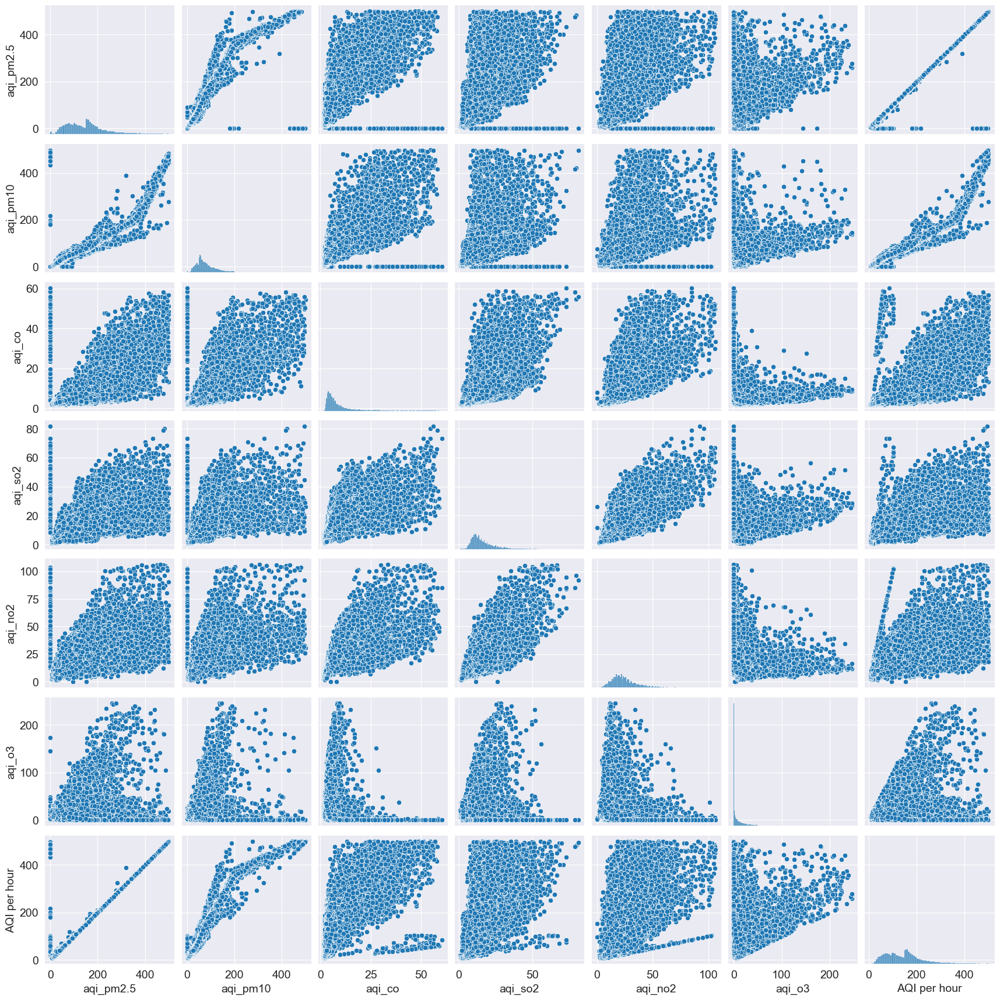

In [18]:
sns.pairplot(data=aqi_df)

In [19]:
aqi_df.AQI_Range.describe()

count     23309
unique        6
top        Poor
freq      10789
Name: AQI_Range, dtype: object

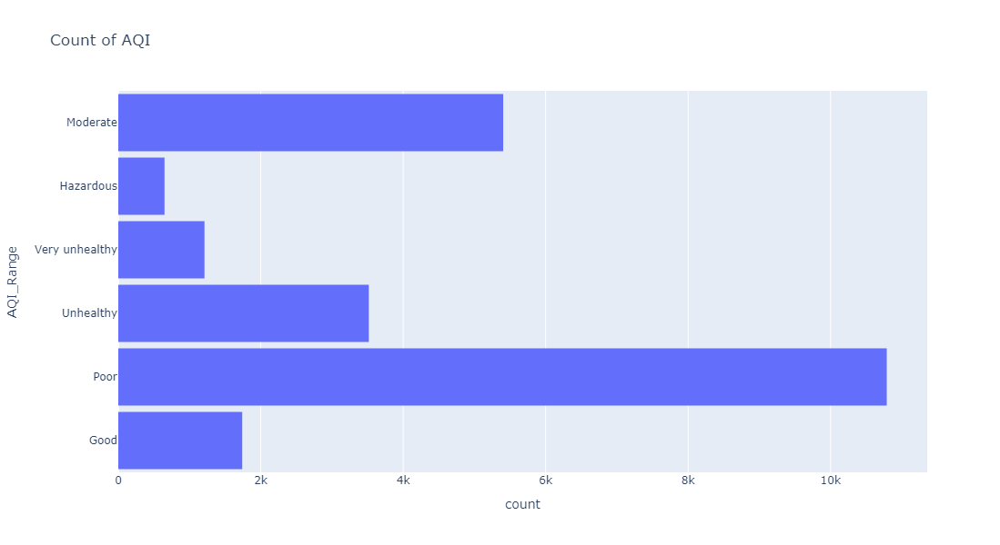

In [20]:
fig = px.histogram(aqi_df, 
                   y='AQI_Range', 
                   nbins=47, 
                   title='Count of AQI')
fig.update_layout(bargap=0.1, height=600)
fig.show()

In [21]:
numeric_df = aqi_df.select_dtypes(include=[np.number])
correlation_matrix = numeric_df.corr()
print(correlation_matrix)

              aqi_pm2.5  aqi_pm10    aqi_co   aqi_so2   aqi_no2    aqi_o3  \
aqi_pm2.5      1.000000  0.886640  0.650807  0.489909  0.535548  0.037642   
aqi_pm10       0.886640  1.000000  0.709532  0.451438  0.513762  0.000093   
aqi_co         0.650807  0.709532  1.000000  0.608570  0.678914 -0.207867   
aqi_so2        0.489909  0.451438  0.608570  1.000000  0.740704 -0.012242   
aqi_no2        0.535548  0.513762  0.678914  0.740704  1.000000 -0.242880   
aqi_o3         0.037642  0.000093 -0.207867 -0.012242 -0.242880  1.000000   
AQI per hour   0.969402  0.945362  0.702601  0.512065  0.564003  0.035095   

              AQI per hour  
aqi_pm2.5         0.969402  
aqi_pm10          0.945362  
aqi_co            0.702601  
aqi_so2           0.512065  
aqi_no2           0.564003  
aqi_o3            0.035095  
AQI per hour      1.000000  


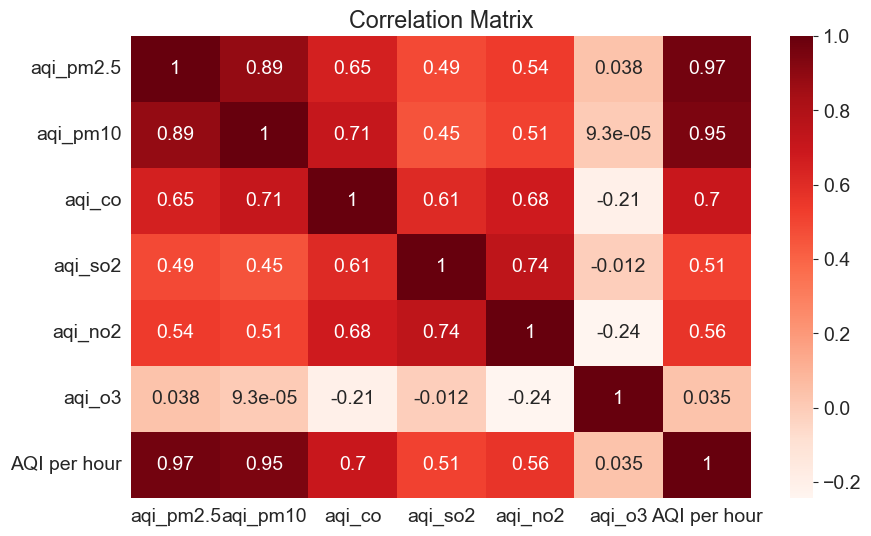

In [22]:
sns.heatmap(correlation_matrix, cmap='Reds', annot=True)
plt.title('Correlation Matrix');

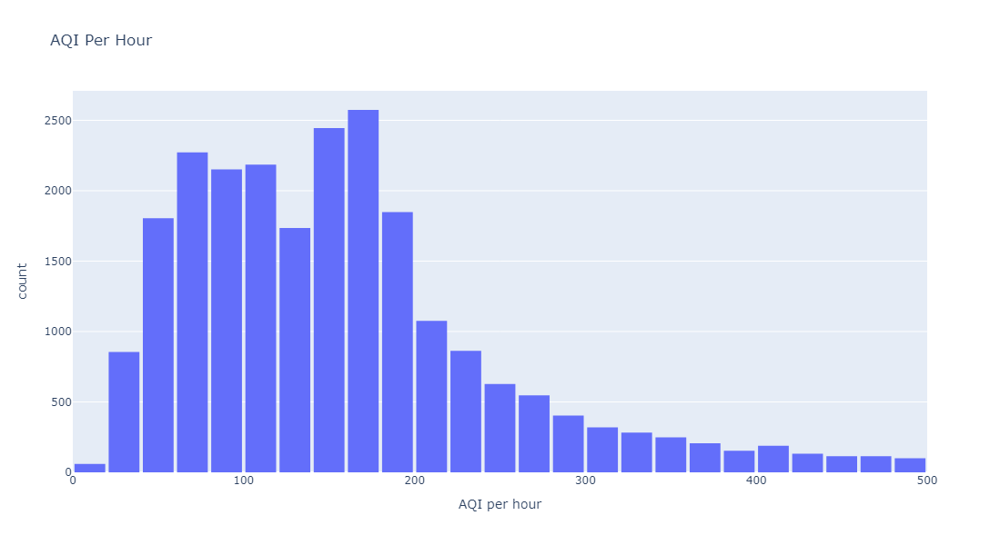

In [23]:
fig = px.histogram(aqi_df, 
                   x='AQI per hour',
                   nbins=47, 
                   title='AQI Per Hour',)
fig.update_layout(bargap=0.1, height=600)
fig.show()

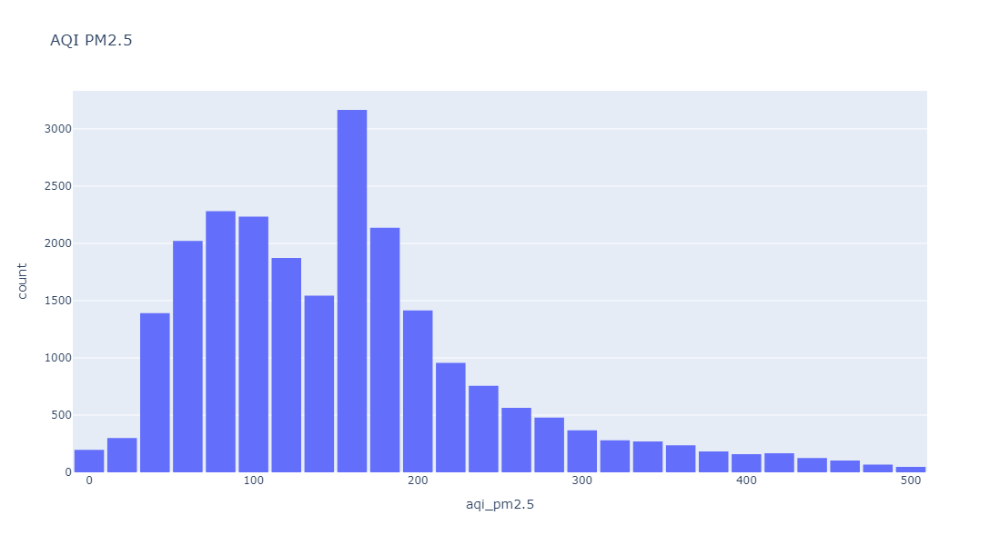

In [24]:
fig = px.histogram(aqi_df, 
                   x='aqi_pm2.5',
                   nbins=47, 
                   title='AQI PM2.5',)
fig.update_layout(bargap=0.1, height=600)
fig.show()

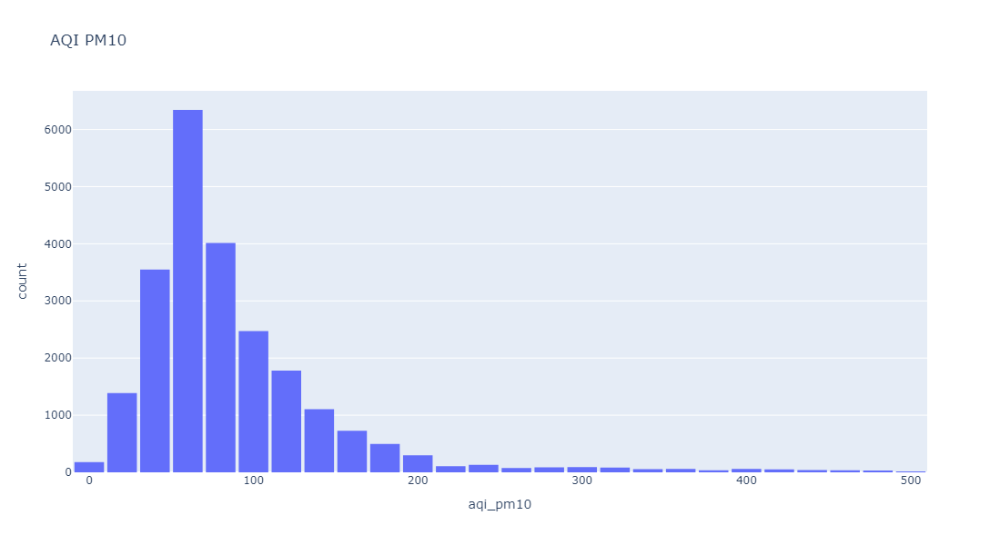

In [25]:
fig = px.histogram(aqi_df, 
                   x='aqi_pm10',
                   nbins=47, 
                   title='AQI PM10',)
fig.update_layout(bargap=0.1, height=600)
fig.show()

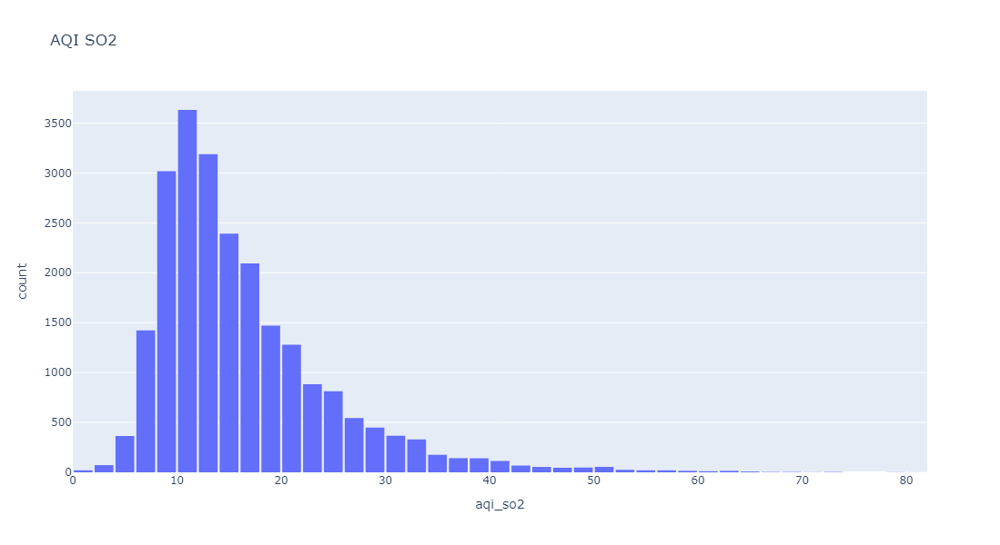

In [26]:
fig = px.histogram(aqi_df, 
                   x='aqi_so2',
                   nbins=47, 
                   title='AQI SO2',)
fig.update_layout(bargap=0.1, height=600)
fig.show()

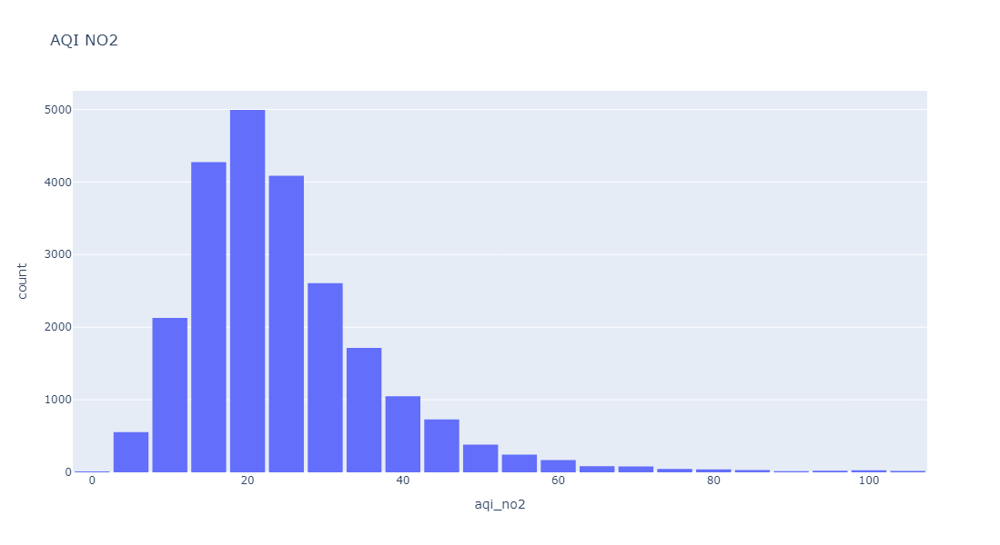

In [27]:
fig = px.histogram(aqi_df, 
                   x='aqi_no2',
                   nbins=47, 
                   title='AQI NO2',)
fig.update_layout(bargap=0.1, height=600)
fig.show()

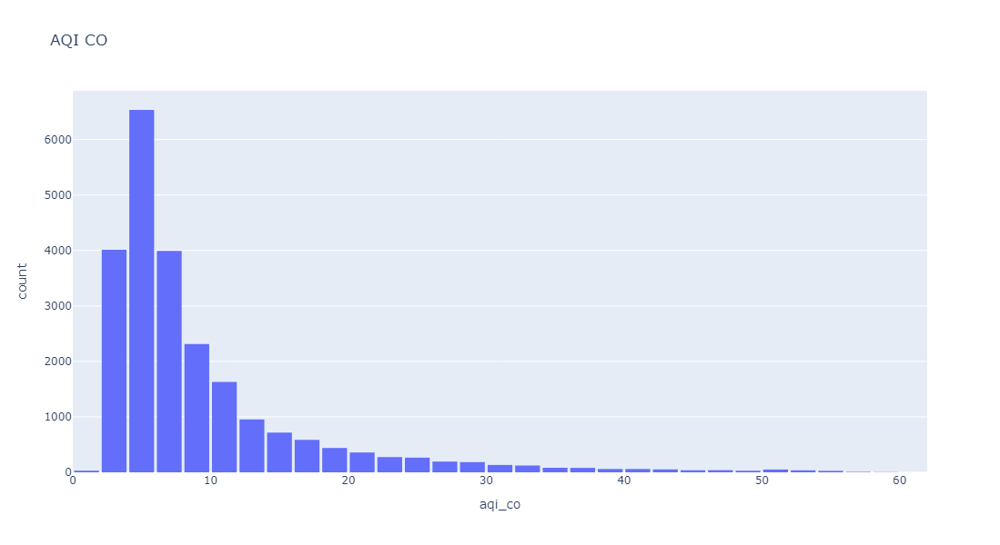

In [28]:
fig = px.histogram(aqi_df, 
                   x='aqi_co',
                   nbins=47, 
                   title='AQI CO',)
fig.update_layout(bargap=0.1, height=600)
fig.show()

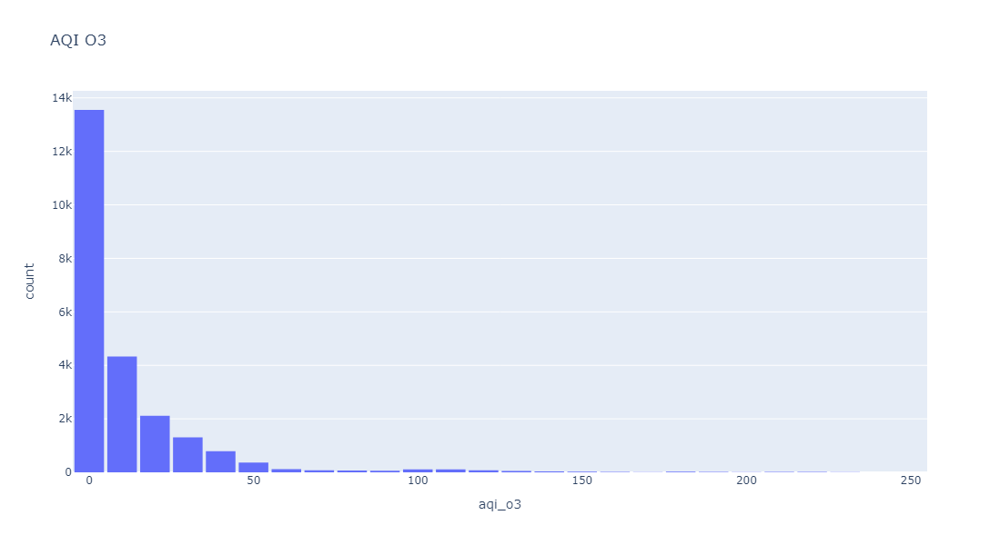

In [29]:
fig = px.histogram(aqi_df, 
                   x='aqi_o3',
                   nbins=47, 
                   title='AQI O3',)
fig.update_layout(bargap=0.1, height=600)
fig.show()

### Kết luận
Từ các biểu đồ trên, ta có thể thấy được chỉ số AQI của bụi mịn PM2.5 có ảnh hưởng nhiều nhất đến chỉ số AQI. Điều này hợp lý vì: Bụi mịn PM2.5 được thải ra thông qua rất nhiều hoạt động thường ngày của con người, từ các nhà máy sản xuất, từ các phương tiện giao thông chạy xăng, dẫn đến nồng độ bụi mịn PM2.5 thường sẽ cao nhất trong số các chất được đo đạc.

#### Phân tích và dự đoán

Chia tập dữ liệu thành cột đặc trưng và cột mục tiêu

In [30]:
input_cols = list(aqi_df.columns)[1:-2]
target_col = 'AQI per hour'

In [31]:
input_cols

['aqi_pm2.5', 'aqi_pm10', 'aqi_co', 'aqi_so2', 'aqi_no2', 'aqi_o3']

In [32]:
target_col

'AQI per hour'

In [33]:
X = aqi_df[input_cols].copy()
y = aqi_df[target_col].copy()

In [34]:
X

,aqi_pm2.5,aqi_pm10,aqi_co,aqi_so2,aqi_no2,aqi_o3
0,0.000000,0.000000,15.88820,12.208,28.790,0.000000
1,0.000000,0.000000,13.75200,15.260,26.390,0.050000
2,0.000000,0.000000,11.74925,17.168,24.675,0.240625
3,0.000000,0.000000,9.74655,18.692,23.305,1.046875
4,0.000000,0.000000,6.34195,16.592,21.765,6.259375
...,...,...,...,...,...,...
23304,77.130371,48.752356,4.40600,2.696,8.570,6.871875
23305,61.407407,40.042173,3.87190,2.932,7.455,14.081250
23306,49.662607,33.454229,3.70505,2.836,6.170,20.115625
23307,43.107959,29.438167,3.47140,2.648,4.455,26.375000


In [35]:
y

0        28.790000
1        26.390000
2        24.675000
3        23.305000
4        21.765000
           ...    
23304    77.130371
23305    61.407407
23306    49.662607
23307    43.107959
23308    39.278091
Name: AQI per hour, Length: 23309, dtype: float64

### Huấn luyện các mô hình

Để dự đoán chỉ số AQI từng giờ dựa trên chỉ số AQI của các chất khác nhau, tôi sẽ sử dụng các mô hình hồi quy, đánh giá các mô hình dựa trên hai chỉ số MSE (Mean Squared Error) và R2 score, mô hình được chọn sẽ có chỉ số MSE thấp nhất và chỉ số R2 cao nhất.
- Mean Squared Error (MSE) có lẽ là số liệu phổ biến nhất được sử dụng cho các bài toán hồi quy. Về cơ bản, nó tìm thấy sai số bình phương trung bình giữa các giá trị được dự đoán và thực tế. MSE là thước đo chất lượng của một công cụ ước tính - nó luôn không âm và các giá trị càng gần 0 càng tốt. (https://viblo.asia/p/danh-gia-model-trong-machine-learing-RnB5pAq7KPG#_21-mean-squared-error-12)
- R-squared là một thước đo thống kê được sử dụng để đánh giá mức độ phù hợp của mô hình hồi quy với các điểm dữ liệu. Chỉ số này mô tả sự biến thiên giữa các giá trị dự đoán và giá trị thực tế. Giá trị R-squared dao động từ 0 đến 1, và càng gần 1 thì mô hình càng khớp tốt với dữ liệu.

In [36]:
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import cross_validate
from sklearn.model_selection import KFold
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import learning_curve
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from sklearn.neighbors import KNeighborsRegressor

## Linear Regression

In [37]:
lr = LinearRegression()

cv_scores = cross_validate(lr, X, y, cv=5, scoring=['neg_mean_squared_error', 'r2'])
cv_scores['test_neg_mean_squared_error'] = -cv_scores['test_neg_mean_squared_error']

cv_scores = pd.DataFrame(cv_scores)

print(cv_scores.round(4))
print(cv_scores.mean().round(4))

lr.fit(X, y)

   fit_time  score_time  test_neg_mean_squared_error  test_r2
0     0.008       0.003                     204.4969   0.9768
1     0.003       0.002                     416.8789   0.9578
2     0.004       0.004                     159.6460   0.9788
3     0.005       0.003                     176.9781   0.9775
4     0.005       0.003                      96.5169   0.9843
fit_time                         0.0050
score_time                       0.0030
test_neg_mean_squared_error    210.9033
test_r2                          0.9750
dtype: float64


LinearRegression()

Đồ thị Learning Curve để kiểm tra mô hình có overfitting hay underfitting hay không

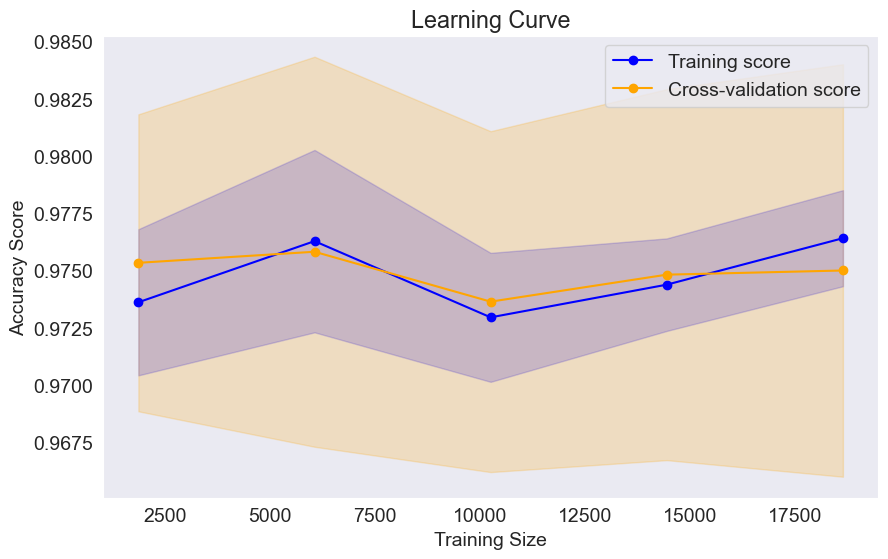

In [50]:
train_sizes, train_scores, test_scores = learning_curve(lr, X, y, cv=5, scoring='r2', n_jobs=-1)

train_scores_mean = np.mean(train_scores, axis=1)  
train_scores_std = np.std(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1) 
test_scores_std = np.std(test_scores, axis=1)

# Vẽ Learning Curve
plt.figure(figsize=(10, 6))
plt.plot(train_sizes, train_scores_mean, 'o-', color='blue', label='Training score')
plt.plot(train_sizes, test_scores_mean, 'o-', color='orange', label='Cross-validation score')

# Vẽ khoảng sai số
plt.fill_between(train_sizes, train_scores_mean - train_scores_std, train_scores_mean + train_scores_std, color='blue', alpha=0.2)
plt.fill_between(train_sizes, test_scores_mean - test_scores_std, test_scores_mean + test_scores_std, color='orange', alpha=0.2)

plt.title('Learning Curve')
plt.xlabel('Training Size')
plt.ylabel('Accuracy Score')
plt.legend(loc='best')
plt.grid()

plt.show()

## Decision Tree Regressor

In [39]:
dt = DecisionTreeRegressor()

cv_scores = cross_validate(dt, X, y, cv=5, scoring=['neg_mean_squared_error', 'r2'])
cv_scores['test_neg_mean_squared_error'] = -cv_scores['test_neg_mean_squared_error']

cv_scores = pd.DataFrame(cv_scores)

print(cv_scores.round(4))
print(cv_scores.mean().round(4))

dt.fit(X, y)

   fit_time  score_time  test_neg_mean_squared_error  test_r2
0    0.1600       0.004                       1.1802   0.9999
1    0.1511       0.004                       2.5809   0.9997
2    0.1614       0.003                       2.0878   0.9997
3    0.1610       0.003                       2.3819   0.9997
4    0.1550       0.004                       1.1226   0.9998
fit_time                       0.1577
score_time                     0.0036
test_neg_mean_squared_error    1.8707
test_r2                        0.9998
dtype: float64


DecisionTreeRegressor()

Đồ thị Learning Curve để kiểm tra mô hình có overfitting hay underfitting hay không

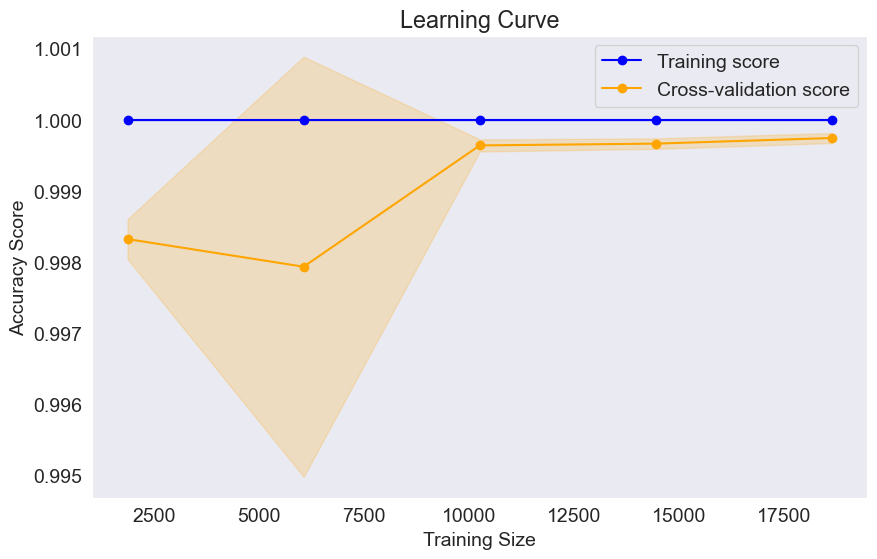

In [51]:
train_sizes, train_scores, test_scores = learning_curve(dt, X, y, cv=5, scoring='r2', n_jobs=-1)

train_scores_mean = np.mean(train_scores, axis=1) 
train_scores_std = np.std(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)  
test_scores_std = np.std(test_scores, axis=1)

# Vẽ Learning Curve
plt.figure(figsize=(10, 6))
plt.plot(train_sizes, train_scores_mean, 'o-', color='blue', label='Training score')
plt.plot(train_sizes, test_scores_mean, 'o-', color='orange', label='Cross-validation score')

# Vẽ khoảng sai số
plt.fill_between(train_sizes, train_scores_mean - train_scores_std, train_scores_mean + train_scores_std, color='blue', alpha=0.2)
plt.fill_between(train_sizes, test_scores_mean - test_scores_std, test_scores_mean + test_scores_std, color='orange', alpha=0.2)

plt.title('Learning Curve')
plt.xlabel('Training Size')
plt.ylabel('Accuracy Score')
plt.legend(loc='best')
plt.grid()

plt.show()

## Random Forest Regressor

In [49]:
rf = RandomForestRegressor()

cv_scores = cross_validate(rf, X, y, cv=5, scoring=['neg_mean_squared_error', 'r2'])
cv_scores['test_neg_mean_squared_error'] = -cv_scores['test_neg_mean_squared_error']

cv_scores = pd.DataFrame(cv_scores)
print(cv_scores.round(4))
print(cv_scores.mean().round(4))

rf.fit(X, y)

   fit_time  score_time  test_neg_mean_squared_error  test_r2
0    9.9274       0.095                       1.1465   0.9999
1    9.9720       0.091                       1.3632   0.9999
2   10.3966       0.115                       1.6281   0.9998
3   10.5172       0.088                       3.2035   0.9996
4   10.2176       0.095                       1.2241   0.9998
fit_time                       10.2062
score_time                      0.0968
test_neg_mean_squared_error     1.7131
test_r2                         0.9998
dtype: float64
CPU times: total: 59.2 s
Wall time: 1min 4s


RandomForestRegressor()

Đồ thị Learning Curve để kiểm tra mô hình có overfitting hay underfitting hay không

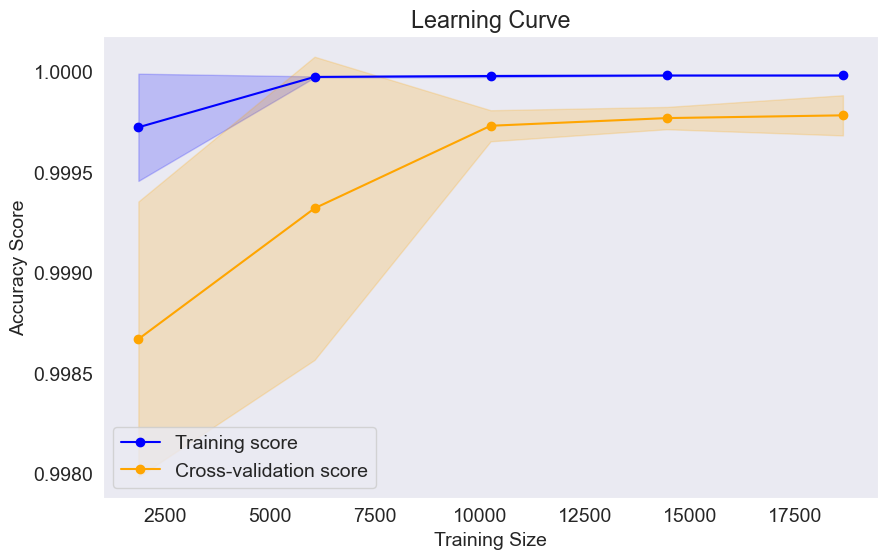

In [53]:
train_sizes, train_scores, test_scores = learning_curve(rf, X, y, cv=5, scoring='r2', n_jobs=-1)

train_scores_mean = np.mean(train_scores, axis=1) 
train_scores_std = np.std(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1) 
test_scores_std = np.std(test_scores, axis=1)

# Vẽ Learning Curve
plt.figure(figsize=(10, 6))
plt.plot(train_sizes, train_scores_mean, 'o-', color='blue', label='Training score')
plt.plot(train_sizes, test_scores_mean, 'o-', color='orange', label='Cross-validation score')

# Vẽ khoảng sai số
plt.fill_between(train_sizes, train_scores_mean - train_scores_std, train_scores_mean + train_scores_std, color='blue', alpha=0.2)
plt.fill_between(train_sizes, test_scores_mean - test_scores_std, test_scores_mean + test_scores_std, color='orange', alpha=0.2)

plt.title('Learning Curve')
plt.xlabel('Training Size')
plt.ylabel('Accuracy Score')
plt.legend(loc='best')
plt.grid()

plt.show()

## XGBRegressor

In [43]:
xgb = XGBRegressor()

cv_scores = cross_validate(xgb, X, y, cv=5, scoring=['neg_mean_squared_error', 'r2'])
cv_scores['test_neg_mean_squared_error'] = -cv_scores['test_neg_mean_squared_error']

cv_scores = pd.DataFrame(cv_scores)
print(cv_scores.round(4))
print(cv_scores.mean().round(4))

xgb.fit(X, y)

   fit_time  score_time  test_neg_mean_squared_error  test_r2
0     0.199       0.015                       2.3698   0.9997
1     0.231       0.014                       7.3879   0.9993
2     0.207       0.012                       2.6740   0.9996
3     0.218       0.013                       2.4941   0.9997
4     0.235       0.014                       1.5212   0.9998
fit_time                       0.2180
score_time                     0.0136
test_neg_mean_squared_error    3.2894
test_r2                        0.9996
dtype: float64


XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=None, n_jobs=None,
             num_parallel_tree=None, random_state=None, ...)

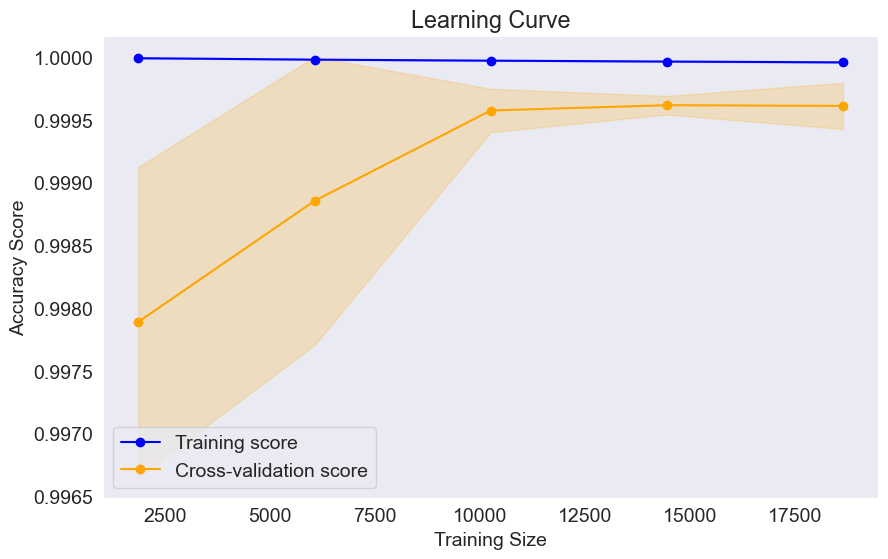

In [54]:
train_sizes, train_scores, test_scores = learning_curve(xgb, X, y, cv=5, scoring='r2', n_jobs=-1)

train_scores_mean = np.mean(train_scores, axis=1)  
train_scores_std = np.std(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)  
test_scores_std = np.std(test_scores, axis=1)

# Vẽ Learning Curve
plt.figure(figsize=(10, 6))
plt.plot(train_sizes, train_scores_mean, 'o-', color='blue', label='Training score')
plt.plot(train_sizes, test_scores_mean, 'o-', color='orange', label='Cross-validation score')

# Vẽ khoảng sai số
plt.fill_between(train_sizes, train_scores_mean - train_scores_std, train_scores_mean + train_scores_std, color='blue', alpha=0.2)
plt.fill_between(train_sizes, test_scores_mean - test_scores_std, test_scores_mean + test_scores_std, color='orange', alpha=0.2)

plt.title('Learning Curve')
plt.xlabel('Training Size')
plt.ylabel('Accuracy Score')
plt.legend(loc='best')
plt.grid()

plt.show()

### Kết luận
Thông qua việc đánh giá 4 mô hình hồi quy: Linear Regression, Decision Tree Regressor, Random Forest Regressor và XGBRegressor, có thể thấy được mô hình Random Forest Regressor hiệu quả nhất trong 4 mô hình, được thể hiện thông qua chỉ số MSE thấp nhất, và có độ chính xác (R2 score) cao nhất trong số 4 mô hình. Vì vậy, tôi sẽ chọn mô hình này để tiếp tục triển khai và thiết kế giao diện

Lưu mô hình đã chọn để triển khai và thiết kế giao diện

In [45]:
import joblib

joblib.dump(rf, 'rf.pkl')

['rf.pkl']